<p align="center"><img src="https://github.com/insaid2018/Term-1/blob/master/Images/INSAID_Full%20Logo.png?raw=true" width="260" height="110" /></p>

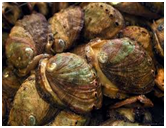

## ABALONE AGE PREDICTION

**Submitted by NARAYAN V. SHANBHAG**

**GCD Student, INSAID**

**Batch: May 9,2021**

## Table of Content

1. [Introduction](#section1)<br>
2. [Problem Statement](#section2)<br>
3. [Library Installments](#section3)<br>
    - 3.1 [Installing Libraries](#section301)<br>
    - 3.2 [Importing Libraries](#section302)<br>
4. [Data Acquisition & Descriptions](#section4)<br>
    - 4.1 [Data Description](#section401)<br>
    - 4.2 [Data Information](#section402)<br>
5. [Data Pre-processing](#section5)<br>
    - 5.1 [Pre-profiling Report](#section501)<br>
    - 5.2 [Data Cleaning](#section502)<br>
    - 5.3 [Post-Profiling Report](#section503)<br>    
6. [Exploratory Data Analysis](#section6)<br>
    - 6.1 [Analysis of Features w.r.t.Target variable](#section601)<br>
7. [Data Post-processing](#section7)<br>
    - 7.1 [Handling Categorical columns](#section701)<br>
    - 7.2 [Feature Extraction](#section702)<br>
    - 7.3 [Linear Regression](#section703)<br>


<a name = section1></a>
## 1. Introduction

**Company Introduction**

- **AB Fresh Supply Co. Ltd.**, is an **Abalone Producing and Processing company.**
- **They want to supply the highest quality of abalones with a good price through direct transactions with fish farms.**
- **They have experience in exporting abalones to North America as well as South East Asia.**
-To find the highest quality abalones, they need to **analyze their measurements.**
-One of the key measurements in this process is the **age** of the abalone.

**Current Scenario**
- The age of abalone is determined by cutting the shell through the cone, staining it, and **counting the number of rings** through a microscope.
- By **adding 1.5** to the number of rings, we get the **abalone’s age in years.**


<a name = section2></a>
## 2. Problem Definition

**The current process suffers from the following problems:**

-Since the **age** of abalone is determined by cutting the shell through the cone, staining it, and counting the number of rings through a microscope.
-This becomes a quite **boring** and **time-consuming task.**

-The company has hired you as data science consultant. They want to **automate** the process of **predicting** the age of abalone from other **physical measurements** rather than doing this manual work.

**Your Role:**

- You are given a dataset containing the **physical measurements** of abalones.
- Your task is to build a regression model using the dataset.
- Because there was no machine learning model for this problem in the company, you don’t have a quantifiable win condition. You need to build the best possible model.

**Project Deliverables:**

- Deliverable: **Predict the number of rings for each abalone.**
- Machine Learning Task: **Regression**
- Target Variable: **Rings**
- Win Condition: N/A (best possible model)

**LIFE EXPECTANCY:**
- Even though the ABALONES have a very **EXTREMELY LOW SURVIVAL RATE**, the WHITE ABALONES have a LIFE SPAN of about **35-40 years**.

**Evaluation Metric:**

- The model evaluation will be based on the **RMSE** score.



<a name = section3></a>
## 3. Library Installments

<a name = section301></a>
### 3.1 Installing Libraries

In [8]:
!pip install -q datascience                                         
# Package that is required by pandas profiling
!pip install -q pandas-profiling                                    
# Library to generate basic statistics about data

# To install more libraries insert your code here..

### **Upgrading Libraries**

- **After upgrading** the libraries, you need to **restart the runtime** to make the libraries in sync.

- Make sure not to execute the cell under Installing Libraries and Upgrading Libraries again after restarting the runtime.

In [9]:
!pip install -q --upgrade pandas-profiling                          
# Upgrading pandas profiling to the latest version

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\user\\anaconda3\\Lib\\site-packages\\~arkupsafe\\_speedups.cp38-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



<a name = section302></a>
### 3.2 Importing Libraries

In [1]:
#-------------------------------------------------------------------------------------------------------------------------------
import pandas as pd                                                 # Importing package pandas (For Panel Data Analysis)
from pandas_profiling import ProfileReport                          # Import Pandas Profiling (To generate Univariate Analysis)
#-------------------------------------------------------------------------------------------------------------------------------
import warnings
warnings.filterwarnings('ignore')
import numpy as np                                                  # Importing package numpys (For Numerical Python)
#-------------------------------------------------------------------------------------------------------------------------------
import matplotlib
import matplotlib.pyplot as plt                                     # Importing pyplot interface to use matplotlib
import seaborn as sns                                             # Importing seaborn library for interactive visualization
%matplotlib inline
#-------------------------------------------------------------------------------------------------------------------------------
import scipy as sp                                                  # Importing library for scientific calculations
#-------------------------------------------------------------------------------------------------------------------------------

<a name = section4></a>
## 4. Data Acquisition & Description

The dataset contains all the necessary information about the abalones like their **sex, length, diameter, height, weight,** etc.

- The column **Rings** is also present in the dataset which is a measure of the age of the abalone. 
- By **adding 1.5** to the number of rings, we get the **abalone’s age in years.**

This is the data that we have to predict for future samples.

The dataset is divided into two parts: Train, and Test sets.

**Train Set:**

- The train set contains **3341** rows and **10** columns.
- The last column **Rings** is the **target** variable.

**Test Set:**
- The test set contains **836** rows and **9** columns.
- The test set doesn’t contain the **Rings** column.
- It needs to be predicted for the **test** set.

The dataset is divided into two parts:

**Train Set:**

| Records |Features|Target Variable|
|:--|:--|:--|
|**3341**|**10**|**Rings**|

**Test Set:**

|Records|Features|Predicted Variable|
|:--|:--|:--|
|**836**|**10**|**Rings**|


**The model development for Age prediction will be done in Jupyter Notebook.**

 |***ID***|****Feature****|****Description****|
|:--|:--|:--|
|01| Id             | Unique Id of the sample|
|02| Sex            |The sex of the abalone (M, F, and I (infant))|
|03| Length         | Longest shell measurement (mm)| 
|04| Diameter       | Diameter of abalone perpendicular to length (mm)|   
|05| Height         | Height of abalone with meat in the shell (mm)|
|06| Whole_weight   | Weight of the whole abalone (grams)|
|07| Shucked_weight | Weight of the meat of abalone (grams)|
|08| Viscera_weight | Gut weight (after bleeding) of the abalone (grams)|
|09| Shell_weight   | Weight of the abalone after being dried (grams)|
|10| Rings          | Number of Rings in the abalone|

In [2]:
# Loading the Train dataset #
data = pd.read_csv('D:/abalone_train.csv')
print('Data Shape: ', data.shape)
print(data.head())


Data Shape:  (3341, 10)
     Id Sex  Length  Diameter  Height  Whole_weight  Shucked_weight  \
0  3141   I   0.180     0.135   0.080        0.0330          0.0145   
1  3521   I   0.215     0.150   0.055        0.0410          0.0150   
2   883   M   0.660     0.530   0.170        1.3905          0.5905   
3  3627   M   0.715     0.525   0.200        1.8900          0.9500   
4  2106   M   0.595     0.455   0.155        1.0410          0.4160   

   Viscera_weight  Shell_weight  Rings  
0          0.0070        0.0100      5  
1          0.0090        0.0125      3  
2          0.2120        0.4530     15  
3          0.4360        0.4305     10  
4          0.2105        0.3650     14  


In [3]:
data_final = pd.read_csv("D:/abalone_test.csv",skipinitialspace=True)
print('Data Shape:', data_final.shape)
print(data_final.head())

Data Shape: (836, 9)
     Id Sex  Length  Diameter  Height  Whole_weight  Shucked_weight  \
0   668   M   0.550     0.425   0.155        0.9175          0.2775   
1  1580   I   0.500     0.400   0.120        0.6160          0.2610   
2  3784   M   0.620     0.480   0.155        1.2555          0.5270   
3   463   I   0.220     0.165   0.055        0.0545          0.0215   
4  2615   M   0.645     0.500   0.175        1.5105          0.6735   

   Viscera_weight  Shell_weight  
0          0.2430        0.3350  
1          0.1430        0.1935  
2          0.3740        0.3175  
3          0.0120        0.0200  
4          0.3755        0.3775  


<a name = section402></a>
### 4.2 Data Information

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3341 entries, 0 to 3340
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Id              3341 non-null   int64  
 1   Sex             3341 non-null   object 
 2   Length          3341 non-null   float64
 3   Diameter        3341 non-null   float64
 4   Height          3341 non-null   float64
 5   Whole_weight    3341 non-null   float64
 6   Shucked_weight  3341 non-null   float64
 7   Viscera_weight  3341 non-null   float64
 8   Shell_weight    3341 non-null   float64
 9   Rings           3341 non-null   int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 261.1+ KB


In [5]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 836 entries, 0 to 835
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Id              836 non-null    int64  
 1   Sex             836 non-null    object 
 2   Length          836 non-null    float64
 3   Diameter        836 non-null    float64
 4   Height          836 non-null    float64
 5   Whole_weight    836 non-null    float64
 6   Shucked_weight  836 non-null    float64
 7   Viscera_weight  836 non-null    float64
 8   Shell_weight    836 non-null    float64
dtypes: float64(7), int64(1), object(1)
memory usage: 58.9+ KB


## Observations :
 - Data set does not have **missing values** in any of the columns 
 - Data Preprocessing report will give clear idea about the dataset.
 

### 4.2 Data Description

In [6]:
data.describe()

,Id,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
count,3341.000000,3341.000000,3341.000000,3341.000000,3341.000000,3341.000000,3341.000000,3341.000000,3341.000000
mean,2085.442083,0.525887,0.409463,0.140129,0.838176,0.363600,0.182507,0.241385,9.958396
std,1197.721846,0.119759,0.098895,0.042623,0.493789,0.224156,0.110439,0.139828,3.205591
min,0.000000,0.075000,0.055000,0.000000,0.002000,0.001000,0.000500,0.001500,1.000000
25%,1055.000000,0.450000,0.350000,0.115000,0.444500,0.188000,0.093500,0.132000,8.000000
50%,2086.000000,0.545000,0.425000,0.145000,0.810000,0.341500,0.172500,0.235000,10.000000
75%,3114.000000,0.620000,0.485000,0.165000,1.168500,0.509500,0.255500,0.330000,11.000000
max,4175.000000,0.815000,0.650000,1.130000,2.779500,1.488000,0.760000,1.005000,27.000000


In [7]:
data_final.describe()

,Id,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight
count,836.000000,836.000000,836.000000,836.000000,836.000000,836.000000,836.000000,836.000000
mean,2098.222488,0.516417,0.401561,0.137069,0.791042,0.342452,0.172949,0.228623
std,1238.919375,0.121196,0.100419,0.038410,0.474981,0.212260,0.105973,0.136280
min,1.000000,0.140000,0.105000,0.020000,0.014500,0.005000,0.003000,0.005000
25%,994.750000,0.445000,0.345000,0.110000,0.432625,0.177875,0.091500,0.121000
50%,2108.500000,0.535000,0.420000,0.140000,0.770750,0.320250,0.161250,0.220000
75%,3202.000000,0.610000,0.475000,0.165000,1.097375,0.472000,0.242625,0.315000
max,4176.000000,0.770000,0.620000,0.240000,2.825500,1.146500,0.641500,0.897000


<a name = section5></a>
## 5. Data Pre-processing

In [11]:
data.isnull().sum()
(data == 0 ).sum(axis = 0)

Id                1
Sex               0
Length            0
Diameter          0
Height            2
Whole_weight      0
Shucked_weight    0
Viscera_weight    0
Shell_weight      0
Rings             0
dtype: int64

In [13]:
data_final.isnull().sum()
(data_final == 0 ).sum(axis = 0)

Id                0
Sex               0
Length            0
Diameter          0
Height            0
Whole_weight      0
Shucked_weight    0
Viscera_weight    0
Shell_weight      0
dtype: int64

## Observations :
 - Training Data set has 0's in **Id** column (1 no.) and **Height** column (2 nos.)
 - Testing Data set does not have 0's in any of the columns
 - The 0 in the Id columns does not seem to be a misnomer and it is a INDEX value
 - Data Preprocessing report will give clear idea about the dataset.
 

### 5.1 Pre-profiling Report

In [15]:
profile_Train = ProfileReport(df = data, minimal = True)
profile_Train.to_file(output_file = 'D:/Abalone_Age_prediction_Training_Set_PreProfilingReport.html')
print('Pre-Profiling Accomplished!')
profile_Train

Summarize dataset:   0%|          | 0/18 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Pre-Profiling Accomplished!


In [16]:
profile_Test = ProfileReport(df = data_final, minimal = True)
profile_Test.to_file(output_file = 'D:/Abalone_Age_prediction_Testing_Set_PreProfilingReport.html')
print('Pre-Profiling Accomplished!')
profile_Test

Summarize dataset:   0%|          | 0/17 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Pre-Profiling Accomplished!


### Checking for DUPLICATE RECORDS

In [17]:
data[data.duplicated()]

,Id,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings


In [18]:
data_final[data_final.duplicated()]

,Id,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight


<a name = section502></a>
### 5.2 Data Cleaning

## Observations 

- **No missing values** in both the **TRAINING** as well as **TESTING** datasets.
- **No Duplicate records** in both the **TRAINING** as well as **TESTING** datasets.
- **Training Data set** has 0's in **Id** column (1 no.) and **Height** column (2 nos.) 
- Replace the 0's in only the **Height** column with either the mean or median as **DEEMED FIT**


### Replace the MISSING VALUES  and 0s with either MEAN, MEDIAN or MODE as DEEMED FIT

In [20]:
print(data['Height'].median())
print(data['Height'].mean())

0.145
0.14012870398084376


In [21]:
data['Height'].fillna(value = 14012870398084376, inplace = True)

<a name = section503></a>
### 5.3 Post-profiling Report

In [22]:
post_profile_data = ProfileReport(df = data,explorative = True)
post_profile_data.to_file(output_file = 'Abalone_Age_prediction_Training_Set_PostProfilingReport.html')
print('Post-Profiling Accomplished!')
post_profile_data

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Post-Profiling Accomplished!


In [23]:
post_profile_data_final = ProfileReport(df = data,explorative = True)
post_profile_data_final.to_file(output_file = 'Abalone_Age_prediction_Testing_Set_PostProfilingReport.html')
print('Post-Profiling Accomplished!')
post_profile_data

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Post-Profiling Accomplished!


<a name = section6></a>
## 6. Exploratory Data Analysis

<AxesSubplot:xlabel='Rings', ylabel='Density'>

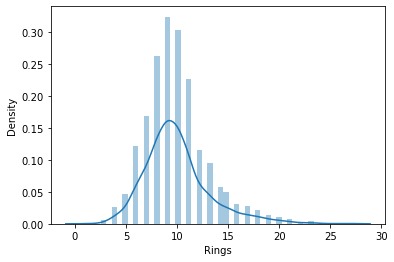

In [24]:
sns.distplot(data['Rings'])

## Observations

 - There is **NO SKEWNESS** in the target variable i.e. Number of Rings.


<a name = section601></a>
### 6.1 Analysis of features w.r.t. Target Variable

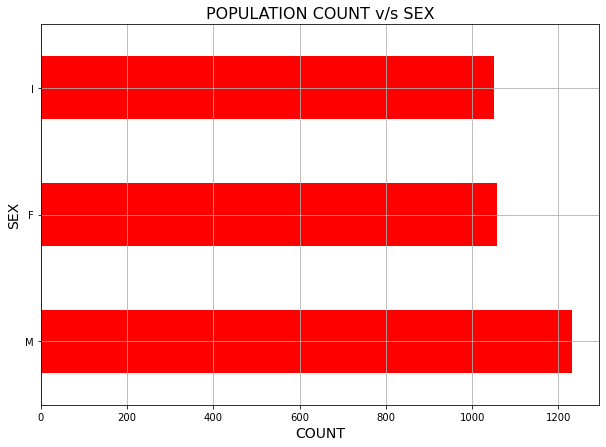

In [33]:
# Population count of the Sexes
fig = plt.figure(figsize = (10,7))
data['Sex'].value_counts().plot(kind = 'barh', cmap = 'autumn')
plt.ylabel('SEX', size = 14)
plt.xlabel('COUNT', size = 14)
plt.title('POPULATION COUNT v/s SEX', size = 16)
plt.grid()

### Correlation between FEATURES using PAIRPLOT, HEATMAP and VIF

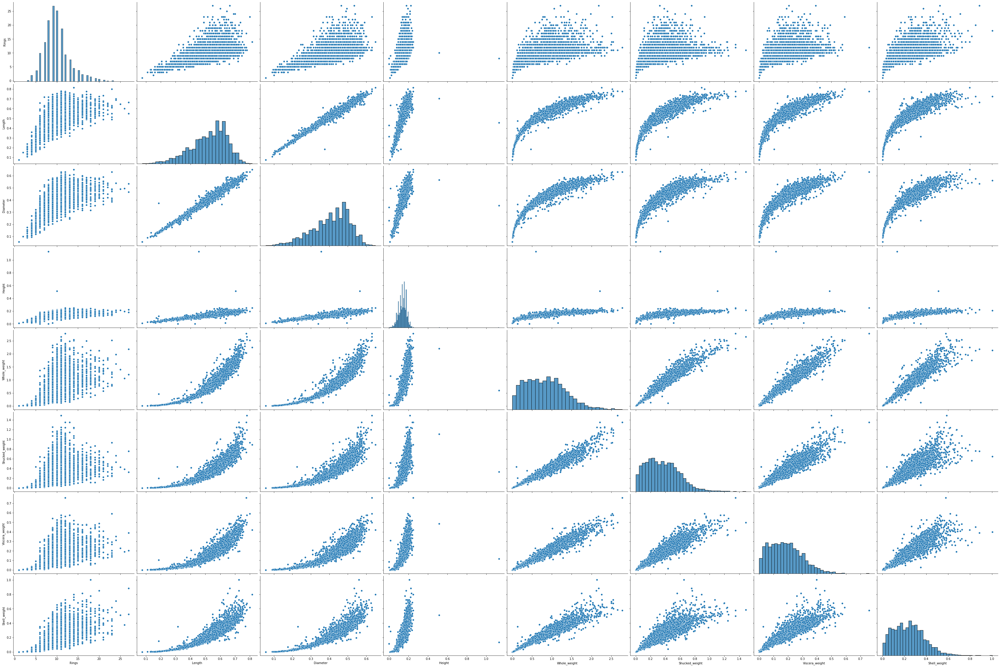

In [151]:
# Correlation between Features
sns.pairplot(data= data[['Rings','Sex','Length','Diameter','Height','Whole_weight','Shucked_weight','Viscera_weight','Shell_weight']], height = 4, aspect = 1.5)

Text(0.5, 1.0, 'Correlation HeatMap')

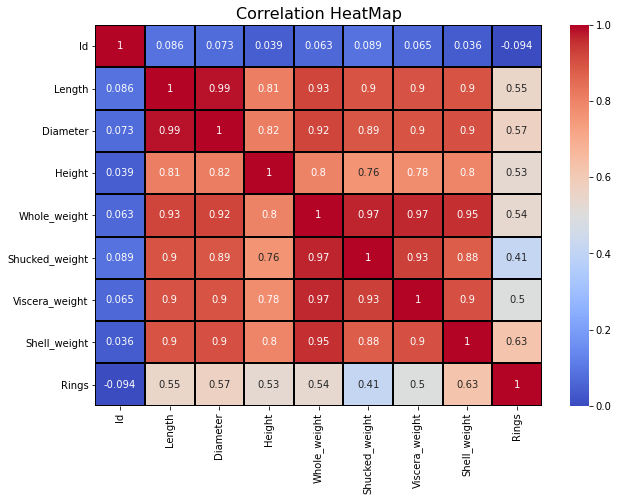

In [152]:
figure = plt.figure(figsize = (10,7))
HeatMap = sns.heatmap(data.corr(),annot = True,cmap = 'coolwarm',vmin = 0, vmax = 1,linecolor = 'black',linewidths = 1)
HeatMap.set_title('Correlation HeatMap', fontdict = {'fontsize':16})

In [38]:
data_check_vif = data[['Id', 'Length', 'Diameter', 'Height', 'Whole_weight',
       'Shucked_weight', 'Viscera_weight', 'Shell_weight', 'Rings']]

In [39]:
#Checking Multicollinearity using VIF ==> Variance Inflation Factor

# Import library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
  # Calculating VIF
  vif = pd.DataFrame()
  vif["variables"] = X.columns
  vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
  return(vif)

c = data_check_vif.iloc[::-1]
calc_vif(c)

,variables,VIF
0,Id,4.088904
1,Length,711.461263
2,Diameter,751.730067
3,Height,37.568054
4,Whole_weight,424.208561
5,Shucked_weight,117.997067
6,Viscera_weight,63.401451
7,Shell_weight,79.123705
8,Rings,21.989343


<AxesSubplot:>

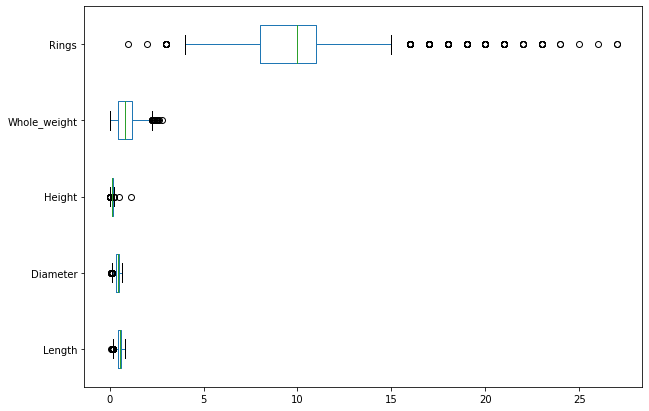

In [40]:
data[['Length', 'Diameter','Height','Whole_weight','Rings']].plot(kind='box', figsize=(10, 7), vert=False)

## Observations
- Whole_weight, Shucked_weight, Viscera_weight, Shell_weight; all these variables have a VERY HIGH CORRELATION with the Target Variable Rings
- Also Whole_weight, Shucked_weight, Viscera_weight, Shell_weight; have **HIGH CORRELATION AMONGST THEMSELVES** leading to **MULTI-COLLINEARITY**
- Hence we can drop Whole_weight, Shucked_weight, Viscera_weigh and reatin ONLY **Shell-weight**
- Also Length, Diameter, Height; all these independent variables have **VERY LOW CORRELATION** with the Target VariableRings
- Also to be noted that Length, Diameter, Height; all these independent variables have a HIGH CORRELATION amongst themselves as well as Whole_weight, Shucked_weight, Viscera_weight, Shell_weight leading to **MULTI-COLLINEARITY**
- Hence we can drop Length, Diameter and retain only **Height**
 


<a name = section7></a>
## 7. Data Post-processing

 - **Machine Learning Linear Algorithm** works with **numerical** values.
 - So, it is necessary to **convert the categorical columns into Numerical columns.**

<a name = section701></a>
### 7.1 Handling Categorical and Numerical columns 

### (A) Categorical Columns : 
**Sex** is the only Categorical column in the DataSet

### (B) Numerical Columns:
**Id, Length, Diameter, Height, Whole_weight, Shucked_weight, Viscera_weight, Shell_weight, Rings** are tge Numerical Columns

In [41]:
data.columns


Index(['Id', 'Sex', 'Length', 'Diameter', 'Height', 'Whole_weight',
       'Shucked_weight', 'Viscera_weight', 'Shell_weight', 'Rings'],
      dtype='object')

In [42]:
data_intermediate = data.drop(["Id", 'Length','Whole_weight', 'Shucked_weight', 'Viscera_weight', ], axis = 1) 

In [43]:
data_categorical = data[['Sex']]

In [49]:
encoded_data_categorical = pd.get_dummies(data_categorical)
encoded_data_categorical

,Sex_F,Sex_I,Sex_M
0,0,1,0
1,0,1,0
2,0,0,1
3,0,0,1
4,0,0,1
...,...,...,...
3336,0,0,1
3337,1,0,0
3338,0,0,1
3339,1,0,0


In [50]:
encoded_data_categorical = pd.get_dummies(data_categorical,drop_first=True)
encoded_data_categorical

,Sex_I,Sex_M
0,1,0
1,1,0
2,0,1
3,0,1
4,0,1
...,...,...
3336,0,1
3337,0,0
3338,0,1
3339,0,0


In [51]:
data_numerical = data[['Height','Shell_weight']]

In [52]:
data_model = pd.concat([encoded_data_categorical,data_numerical], axis=1)
data_model

,Sex_I,Sex_M,Height,Shell_weight
0,1,0,0.080,0.0100
1,1,0,0.055,0.0125
2,0,1,0.170,0.4530
3,0,1,0.200,0.4305
4,0,1,0.155,0.3650
...,...,...,...,...
3336,0,1,0.185,0.4770
3337,0,0,0.140,0.2850
3338,0,1,0.145,0.2535
3339,0,0,0.165,0.3185


In [53]:
#Checking Multicollinearity using VIF ==> Variance Inflation Factor

# Import library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
  # Calculating VIF
  vif = pd.DataFrame()
  vif["variables"] = X.columns
  vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
  return(vif)

c = data_model.iloc[::-1]
calc_vif(c)

,variables,VIF
0,Sex_I,1.726745
1,Sex_M,1.930962
2,Height,14.718147
3,Shell_weight,11.576214


### Picking only the required FEATURES and Re-arranging the data set as per our need
#### Dropping the Columns Length, Diameter, Whole_weight, Sucked_weight, Viscera_weight from the FEATURES as these are HIGHLY MULTICOLLINEAR as observed from the PAIRPLOT, HEATMAP and VIF

<a name = section702></a>
### 7.2 Feature Extraction

### Split the data into x and y. Meaning y is the DEPENDENT/TARGET variable and x as FEATURE/INDEPENDENT variable

In [54]:
x = data_model
x

,Sex_I,Sex_M,Height,Shell_weight
0,1,0,0.080,0.0100
1,1,0,0.055,0.0125
2,0,1,0.170,0.4530
3,0,1,0.200,0.4305
4,0,1,0.155,0.3650
...,...,...,...,...
3336,0,1,0.185,0.4770
3337,0,0,0.140,0.2850
3338,0,1,0.145,0.2535
3339,0,0,0.165,0.3185


In [55]:
y = data['Rings']
y

0        5
1        3
2       15
3       10
4       14
        ..
3336    10
3337    12
3338    10
3339     9
3340     8
Name: Rings, Length: 3341, dtype: int64

### Import the train test split and split the data into train and test data for x and y.

In [56]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

### Print the shape/size of the Training and Testing data

In [57]:
print("TRAINING CASES as below:")
print("x_train shape:",x_train.shape)
print("y_train shape:",y_train.shape)
print("TESTING CASES as below:")
print("x_test shape:",x_test.shape)
print("y_test shape:",y_test.shape)

TRAINING CASES as below:
x_train shape: (2672, 4)
y_train shape: (2672,)
TESTING CASES as below:
x_test shape: (669, 4)
y_test shape: (669,)


In [78]:
x_train

,Sex_I,Sex_M,Height,Shell_weight
245,0,0,0.110,0.1950
2262,1,0,0.155,0.2800
242,0,0,0.250,0.7975
1203,0,0,0.165,0.2590
951,0,1,0.110,0.1400
...,...,...,...,...
835,1,0,0.065,0.0280
3264,0,1,0.195,0.4250
1653,0,1,0.190,0.2935
2607,0,1,0.175,0.5250


In [58]:
y_train

245     17
2262     9
242     14
1203     9
951      8
        ..
835      6
3264     9
1653    10
2607    20
2732    19
Name: Rings, Length: 2672, dtype: int64

In [59]:
x_test

,Sex_I,Sex_M,Height,Shell_weight
2709,0,1,0.085,0.0500
2748,1,0,0.130,0.1540
2436,1,0,0.130,0.1800
92,0,0,0.125,0.1950
569,0,1,0.175,0.3950
...,...,...,...,...
446,0,1,0.165,0.5200
1742,0,0,0.135,0.1770
2524,1,0,0.115,0.1175
2710,0,0,0.115,0.0935


In [60]:
y_test

2709     7
2748     7
2436    11
92      11
569     12
        ..
446     10
1742     8
2524     7
2710     8
530     10
Name: Rings, Length: 669, dtype: int64

<a name = section703></a>
### 7.3 Linear Regression

**Here, we will use these 4 steps :** 

 - (a) Load the algorithm 
 - (b) Instantiate and Fit the model/Train the model using the training dataset
 - (c) Prediction on the test set
 - (d) Evaluate the model - Calculate RMSE 

In [61]:
from sklearn.linear_model import LinearRegression
lr_model = LinearRegression(fit_intercept=True)

In [62]:
lr_model.fit(x_train, y_train)

LinearRegression()

In [63]:
y_pred_train = lr_model.predict(x_train) 
y_pred_train


array([ 9.52868355,  9.98718992, 17.30624758, ..., 11.22617497,
       13.4907707 , 11.20608299])

In [64]:
y_pred_test = lr_model.predict (x_test)
y_pred_test

array([ 7.57343907,  8.40568939,  8.67775353,  9.68650506, 12.13045   ,
       10.34490136, 12.35741073,  9.44442261,  7.3674557 , 12.71672145,
        9.39437434, 12.04007024, 13.35235267, 10.00367261,  9.75480824,
       13.38374469,  8.36325908,  7.88793352,  9.19851849, 10.64341266,
       10.55970062,  8.14380211,  9.09359129, 12.53854621, 13.46547212,
       12.1492792 ,  7.00644752,  7.57315192, 12.77654523,  8.10165894,
       10.24549331, 11.03172944, 11.10086865,  6.92768033, 11.4525868 ,
       11.38891594,  7.99286071, 10.54343032,  8.58749735,  9.82607167,
        8.8972105 , 10.1411404 ,  7.76566219,  9.35490428,  8.12695752,
        8.77852255, 12.44379588,  9.30616814,  6.58150672,  9.83109127,
        6.59748987, 12.14870491, 11.50260968, 12.14033972,  8.93548263,
       12.67305376,  6.00455071, 12.18334432, 10.87362078,  9.37201061,
        8.04687821, 13.24449063, 11.08318803,  7.57286478, 10.24405759,
       12.56783941,  8.67330821,  8.19640928, 10.89158854,  6.58

## Different Metrics for Evaluation of the LINEAR MODEL

### RMSE is the go-to Metric here

In [65]:
from sklearn import metrics
RMSE_train = np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))
RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE for training set is {}'.format(RMSE_train))
print('RMSE for test set is {}'.format(RMSE_test))

RMSE for training set is 2.527741817044047
RMSE for test set is 2.2615505243529594


### We have also calculated other Metrics viz. 
### MAE (Mean Average Error)
### RMLSE (Root Mean squared logarithmic Error)
### R2 or R-SQUARED ERROR
### MAPE (Mean Average Percentage Error)

In [66]:
MAE_train = metrics.mean_absolute_error(y_train, y_pred_train)
MAE_test = metrics.mean_absolute_error(y_test, y_pred_test)

In [67]:
print('MAE for training set is {}'.format(MAE_train))
print('MAE for test set is {}'.format(MAE_test))

MAE for training set is 1.833200873115913
MAE for test set is 1.6722081195861553


In [68]:
MLSE_train = np.sqrt(metrics.mean_squared_log_error(y_train, y_pred_train))
MLSE_test = np.sqrt(metrics.mean_squared_log_error(y_test,y_pred_test))
print('Root Mean squared logarithmic Error(RMLSE) of train data:',MLSE_train)
print('Root Mean squared logarithmic Error(RMLSE) of test data:',MLSE_train)

Root Mean squared logarithmic Error(RMLSE) of train data: 0.204168188301506
Root Mean squared logarithmic Error(RMLSE) of test data: 0.204168188301506


In [69]:
r2_train = metrics.r2_score(y_train, y_pred_train)
r2_test = metrics.r2_score(y_test, y_pred_test)
print('R-Squared of train data:',r2_train)
print('R-Squared of test data:',r2_test)

R-Squared of train data: 0.4053389370606081
R-Squared of test data: 0.38711714232068184


In [71]:
MAPE_train = metrics.mean_absolute_percentage_error(y_train, y_pred_train)
MAPE_test = metrics.mean_absolute_percentage_error(y_test, y_pred_test)
print('MAPE of train data:',MAPE_train)
print('MAPE of test data:',MAPE_test)

MAPE of train data: 0.18196517774783855
MAPE of test data: 0.17576595882471588


## Analyzing the Test File

### Seperate out the Categorical and Numerical Columns in the Test DataSet

In [95]:
data_submission = data_final['Id']
data_submission

0       668
1      1580
2      3784
3       463
4      2615
       ... 
831     575
832    3231
833    1084
834     290
835    2713
Name: Id, Length: 836, dtype: int64

In [96]:
data_final_categorical = data_final[['Sex']]
data_final_categorical

,Sex
0,M
1,I
2,M
3,I
4,M
...,...
831,F
832,M
833,I
834,M


In [97]:
data_final_numerical = data_final[['Height','Shell_weight']]
data_final_numerical

,Height,Shell_weight
0,0.155,0.3350
1,0.120,0.1935
2,0.155,0.3175
3,0.055,0.0200
4,0.175,0.3775
...,...,...
831,0.140,0.3500
832,0.120,0.1250
833,0.105,0.1170
834,0.180,0.3250


In [98]:
encoded_data_final = pd.get_dummies(data_final_categorical)
encoded_data_final

,Sex_F,Sex_I,Sex_M
0,0,0,1
1,0,1,0
2,0,0,1
3,0,1,0
4,0,0,1
...,...,...,...
831,1,0,0
832,0,0,1
833,0,1,0
834,0,0,1


In [99]:
encoded_data_final = pd.get_dummies(data_final_categorical,drop_first=True)
encoded_data_final

,Sex_I,Sex_M
0,0,1
1,1,0
2,0,1
3,1,0
4,0,1
...,...,...
831,0,0
832,0,1
833,1,0
834,0,1


In [100]:
data_final_model = pd.concat([encoded_data_final,data_final_numerical], axis=1)
data_final_model

,Sex_I,Sex_M,Height,Shell_weight
0,0,1,0.155,0.3350
1,1,0,0.120,0.1935
2,0,1,0.155,0.3175
3,1,0,0.055,0.0200
4,0,1,0.175,0.3775
...,...,...,...,...
831,0,0,0.140,0.3500
832,0,1,0.120,0.1250
833,1,0,0.105,0.1170
834,0,1,0.180,0.3250


In [101]:
y_pred_test_final = lr_model.predict(data_final_model)
y_pred_test_final

array([11.29218099,  8.71380326, 11.1090609 ,  6.2144051 , 11.94732991,
       11.71881926,  8.5794193 ,  9.28717539,  7.84005881, 11.44885393,
        8.04962606,  6.59254502,  8.5715142 ,  9.30229711,  6.43443636,
       10.94362143,  7.90857438, 11.86999844, 11.9394248 ,  7.77118134,
        7.21078277,  6.82275313,  8.15340468,  8.01082848,  9.6200883 ,
       10.55998776,  6.49743279, 12.54987165,  9.26983126, 10.45362484,
        8.01902073,  5.68919482, 11.15405011, 14.63649049,  7.52556436,
        9.40866003,  8.3484245 , 10.93726624,  7.99701889, 12.06936344,
       10.77070359,  9.42519207, 10.45506056, 10.61259493, 11.62493035,
        8.98837695, 10.36640366, 12.09086574, 10.30197151,  7.49883006,
       11.10000722,  7.2840308 ,  8.79620317, 12.56669084,  9.5121515 ,
        8.61052418,  7.12233826,  7.73039915,  7.31513568,  7.0532484 ,
       10.54371747, 10.22513959, 10.36059737,  8.10194609,  7.43081402,
       12.7059703 , 12.8695981 , 12.28827151,  8.97655197, 14.16

### Add 1.5 to the Number of Rings to Calculate the AGE

In [102]:
y_pred_test_final_age = (y_pred_test_final + 1.5)
y_pred_test_final_age

array([12.79218099, 10.21380326, 12.6090609 ,  7.7144051 , 13.44732991,
       13.21881926, 10.0794193 , 10.78717539,  9.34005881, 12.94885393,
        9.54962606,  8.09254502, 10.0715142 , 10.80229711,  7.93443636,
       12.44362143,  9.40857438, 13.36999844, 13.4394248 ,  9.27118134,
        8.71078277,  8.32275313,  9.65340468,  9.51082848, 11.1200883 ,
       12.05998776,  7.99743279, 14.04987165, 10.76983126, 11.95362484,
        9.51902073,  7.18919482, 12.65405011, 16.13649049,  9.02556436,
       10.90866003,  9.8484245 , 12.43726624,  9.49701889, 13.56936344,
       12.27070359, 10.92519207, 11.95506056, 12.11259493, 13.12493035,
       10.48837695, 11.86640366, 13.59086574, 11.80197151,  8.99883006,
       12.60000722,  8.7840308 , 10.29620317, 14.06669084, 11.0121515 ,
       10.11052418,  8.62233826,  9.23039915,  8.81513568,  8.5532484 ,
       12.04371747, 11.72513959, 11.86059737,  9.60194609,  8.93081402,
       14.2059703 , 14.3695981 , 13.78827151, 10.47655197, 15.66

### Convert the array into a DataFrame

In [103]:
y_pred_test_final = pd.DataFrame(y_pred_test_final)

In [104]:
y_pred_test_final 

,0
0,11.292181
1,8.713803
2,11.109061
3,6.214405
4,11.947330
...,...
831,11.466247
832,8.726490
833,7.755485
834,11.450577


### Round off the values in the Rings Column

In [105]:
y_pred_test_final = y_pred_test_final.round()
y_pred_test_final 

,0
0,11.0
1,9.0
2,11.0
3,6.0
4,12.0
...,...
831,11.0
832,9.0
833,8.0
834,11.0


### Prepare the submission file which should have only two columns viz. the KEY/INDEX column(customerID) and TARGET column(Churn)

In [106]:
submission_file = pd.concat([data_submission,y_pred_test_final], axis = 1)

In [107]:
submission_file

,Id,0
0,668,11.0
1,1580,9.0
2,3784,11.0
3,463,6.0
4,2615,12.0
...,...,...
831,575,11.0
832,3231,9.0
833,1084,8.0
834,290,11.0


### To write the final data to the submission file which is .csv without HEADER and INDEX

In [108]:
submission_file.to_csv('D://abalone_age_prediction_submission.csv', header=False, index=False)

## THANK YOU !!!!